<a href="https://colab.research.google.com/github/samikshagadhave/binary_classification/blob/main/Copy_of_efficientnetB4_by_image_processing_method_1_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive

/content/gdrive


In [ ]:
import pandas as pd

df=pd.read_excel(r'/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Train 1.xlsx')

df['OR_Gate']=df['Tower']|df['Transmission line']|df['insulator']|df['vibration damper']
#print(df['OR_Gate'])

Bad_dataset=list(df[df['OR_Gate']==0]["Image Name"])
#print(Bad_dataset)

Good_dataset=list(df[df['OR_Gate']==1]["Image Name"])
#print(Good_dataset)
path=r"/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/train/"

img_path_Bad_dataset=r"/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Train/bad_dataset/"

img_path_Good_dataset =r"/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Train/good_dataset/"
import shutil
for i in Bad_dataset:
   src_path=path+i
   #print(src_path)
   dest_path=img_path_Bad_dataset+i
   #print(dest_path)
   temp=shutil.copy(src_path,dest_path)
   #print(temp)
   print("bad_dataset folder created and relevant images have been moved")
for i in Good_dataset:
   src_path=path+i
   #print(src_path)
   dest_path=img_path_Good_dataset+i
   #print(dest_path)
   temp=shutil.copy(src_path, dest_path)
   print("good_dataset folder created and relevant images have been moved")


df=pd.read_excel(r'/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test 1.xlsx')

df['OR_Gate']=df['Tower']|df['Transmission line']|df['insulator']|df['vibration damper']
#print(df['OR_Gate'])

Bad_dataset=list(df[df['OR_Gate']==0]["Image Name"])
Good_dataset=list(df[df['OR_Gate']==1]["Image Name"])
#print(Good_dataset)
path=r"/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/test/"

img_path_Bad_dataset=r"/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/"
img_path_Good_dataset =r"/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/"
import shutil
for i in Bad_dataset:
   src_path=path+i
   #print(src_path)
   dest_path=img_path_Bad_dataset+i
   #print(dest_path)
   temp=shutil.copy(src_path,dest_path)
   #print(temp)
   print("bad_dataset folder created and relevant images have been moved")
for i in Good_dataset:
   src_path=path+i
   #print(src_path)
   dest_path=img_path_Good_dataset+i
   #print(dest_path)
   temp=shutil.copy(src_path, dest_path)
   print("good_dataset folder created and relevant images have been moved")


bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have been moved
bad_dataset folder created and relevant images have bee

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten,Dropout,Conv2D,GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Sequential
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt

train_ds=keras.utils.image_dataset_from_directory(
    directory=r'/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Train',
    labels='inferred',
    label_mode='int',
    batch_size=4,
    image_size=(380,380)
)
validation_ds=keras.utils.image_dataset_from_directory(
    directory=r'/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test',
    labels='inferred',
    label_mode='int',
    batch_size=4,
    image_size=(380,380)
)
print(train_ds)
print(validation_ds)



Found 198 files belonging to 2 classes.
Found 86 files belonging to 2 classes.
<_BatchDataset element_spec=(TensorSpec(shape=(None, 380, 380, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_BatchDataset element_spec=(TensorSpec(shape=(None, 380, 380, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
def process(image,label):
   image=tf.cast(image/255.,tf.float32)
   return image,label
train_ds=train_ds.map(process)
validation_ds=validation_ds.map(process)

In [ ]:
from tensorflow.keras.applications import EfficientNetB4
model=EfficientNetB4(weights='imagenet',include_top=False,input_shape=(380,380,3))
my_model=Sequential([model,
                     Conv2D(1024,3,1,activation='relu'),
                     GlobalAveragePooling2D(),
                     Dense(1024,activation='relu'),
                     Dropout(0.2),
                     Dense(1024,activation='relu'),
                     Dropout(0.2),
                     Dense(1,activation='sigmoid'),
                     ])
my_model.summary()

71686520/71686520 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb4 (Functional)  (None, 12, 12, 1792)     17673823  
                                                                 
 conv2d (Conv2D)             (None, 10, 10, 1024)      16516096  
                                                                 
 global_average_pooling2d (G  (None, 1024)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1024)              1049600   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 1024)              10

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras import metrics
metrics=['accuracy']
my_model.compile(loss=BinaryCrossentropy(),optimizer=Adam(learning_rate=0.001),metrics=metrics)

In [ ]:
history=my_model.fit(train_ds,epochs=10,validation_data=validation_ds)

Epoch 1/10
50/50 [==============================] - 160s 675ms/step - loss: 1.4160 - accuracy: 0.8384 - val_loss: 3.4219 - val_accuracy: 0.2558
Epoch 2/10
50/50 [==============================] - 35s 611ms/step - loss: 1.3529 - accuracy: 0.8384 - val_loss: 4.6475 - val_accuracy: 0.2558
Epoch 3/10
50/50 [==============================] - 32s 596ms/step - loss: 0.3950 - accuracy: 0.8939 - val_loss: 1.6272 - val_accuracy: 0.2558
Epoch 4/10
50/50 [==============================] - 30s 549ms/step - loss: 0.1344 - accuracy: 0.9444 - val_loss: 11.9256 - val_accuracy: 0.2558
Epoch 5/10
50/50 [==============================] - 34s 636ms/step - loss: 1.1380 - accuracy: 0.8535 - val_loss: 1.0739 - val_accuracy: 0.2558
Epoch 6/10
50/50 [==============================] - 32s 584ms/step - loss: 0.5883 - accuracy: 0.8838 - val_loss: 1057.6202 - val_accuracy: 0.7442
Epoch 7/10
50/50 [==============================] - 32s 583ms/step - loss: 0.3274 - accuracy: 0.8889 - val_loss: 1.1361 - val_accuracy: 0

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
import numpy as np
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0066.jpg')
print(type(image))
print(image.mode)
print(image.format)
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

<class 'PIL.JpegImagePlugin.JpegImageFile'>
RGB
JPEG
1/1 [==============================] - 5s 5s/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0108.jpg')
print(type(image))
print(image.mode)
print(image.format)
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

<class 'PIL.JpegImagePlugin.JpegImageFile'>
RGB
JPEG
1/1 [==============================] - 0s 37ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0110.jpg')
print(type(image))
print(image.mode)
print(image.format)
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

<class 'PIL.JpegImagePlugin.JpegImageFile'>
RGB
JPEG
1/1 [==============================] - 0s 34ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0489.jpg')
print(type(image))
print(image.mode)
print(image.format)
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

<class 'PIL.JpegImagePlugin.JpegImageFile'>
RGB
JPEG
1/1 [==============================] - 0s 36ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0491.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 41ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0493.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 34ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0495.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 38ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0497.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 39ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0499.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 62ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0501.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0503.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 34ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0505.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0507.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 41ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0509.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 53ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0608.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 37ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0610.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0976.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 34ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0978.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0980.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 56ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0982.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0984.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 40ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/bad_dataset/DJI_0986.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 35ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0869.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0871.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 42ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0873.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 41ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0875.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 47ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0877.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 38ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0879.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0881.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 45ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0883.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 37ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0885.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 35ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0887.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 49ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0889.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0891.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0893.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 53ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0895.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0897.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0899.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 51ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0901.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0903.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 43ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0905.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 65ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0907.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 35ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0909.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0911.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0913.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 40ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0915.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0917.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 45ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0919.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 35ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0921.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 35ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0923.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0925.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 50ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0927.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0929.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0931.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 50ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0933.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0935.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0937.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0939.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 34ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0941.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 46ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0943.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0945.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 39ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0947.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 36ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0949.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0951.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0953.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 45ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0955.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 35ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0957.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0959.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 31ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0961.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 47ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0963.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 40ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0965.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0967.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0969.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0971.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0973.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0975.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 34ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0977.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 38ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0979.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 31ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0981.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 49ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0983.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0985.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 36ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0987.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 56ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0989.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 40ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0991.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 32ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0993.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 34ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0995.jpg')
image_resized=image.resize((380,380))
image=np.expand_dims(image_resized,axis=0)
pred=my_model.predict(image)
print(pred)

1/1 [==============================] - 0s 50ms/step
[[0.]]


In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
truth=['bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good']
prediction=['bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad']
print(classification_report(truth,prediction))
print(confusion_matrix(truth,prediction))

              precision    recall  f1-score   support

         bad       0.26      1.00      0.41        22
        good       0.00      0.00      0.00        64

    accuracy                           0.26        86
   macro avg       0.13      0.50      0.20        86
weighted avg       0.07      0.26      0.10        86

[[22  0]
 [64  0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  we can apply resizing+brightness combination.







(380, 380, 3)
(1, 380, 380, 3)
1/1 [==============================] - 3s 3s/step
[[0.]]


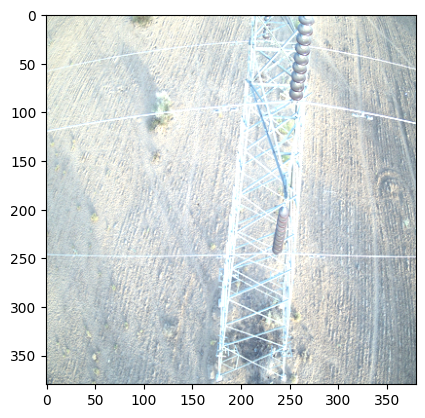

In [ ]:
from PIL import ImageEnhance
from PIL import Image
import numpy as np

from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import imagenet_utils
img=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0869.jpg')
img_resize=img.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_bri=ImageEnhance.Brightness(img_resize)
new_bri=1.6
img_brightened=curr_bri.enhance(new_bri)
plt.imshow(img_brightened)
image =img_to_array(img_brightened)
print(image.shape)
img1 = np.expand_dims(image,axis=0)
print(img1.shape)
#from copy import deepcopy
#img_2=deepcopy(img1)
#images=[img1,img_2]
prediction=my_model.predict(img1)
print(prediction)


1/1 [==============================] - 0s 35ms/step
[[0.]]


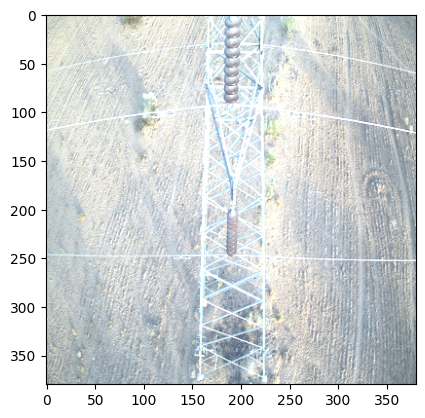

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0871.jpg')
img_resize=image.resize((380,380))

curr_bri=ImageEnhance.Brightness(img_resize)
new_bri=1.6
img_brightened=curr_bri.enhance(new_bri)
plt.imshow(img_brightened)
img = img_to_array(img_brightened)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)
#pred==1


before image proceesing good image predict bad, after image proceesing good image predict bad. so this image proceesing method can not predict correctly.

 we can apply resizing+medianfilter combination.

In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import MedianFilter
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0869.jpg')
img_resize=image.resize((380,380))
image_medianblur=img_resize.filter(ImageFilter.MedianFilter(size=3))

img = img_to_array(image_medianblur)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 35ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0871.jpg')
img_resize=image.resize((380,380))
image_medianblur=img_resize.filter(ImageFilter.MedianFilter(size=3))

img = img_to_array(image_medianblur)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 35ms/step
[[0.]]


before image proceesing good image predict bad, after image proceesing good image predict bad. so this image proceesing method can not predict correctly.

we can apply resizing+bilinear combination

In [ ]:
from PIL import Image
from PIL.Image import BILINEAR
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0869.jpg')
newsize=((380,380))
resized_image=image.resize(newsize,Image.BILINEAR)
img = img_to_array(resized_image)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 63ms/step
[[0.]]


In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0871.jpg')
newsize=((380,380))
resized_image=image.resize(newsize,Image.BILINEAR)
img = img_to_array(resized_image)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 35ms/step
[[0.]]


before image proceesing good image predict bad, after image proceesing good image predict bad. so this image proceesing method can not predict correctly.

 we apply resizing+contrast to the image


1/1 [==============================] - 0s 34ms/step
[[0.]]


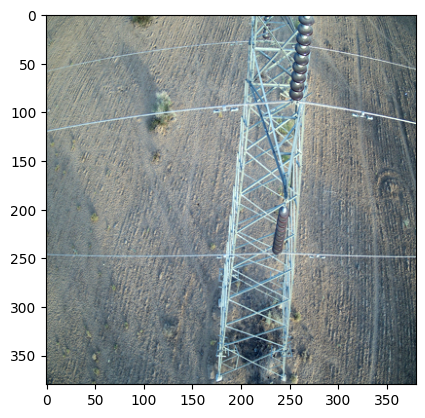

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0869.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_con=ImageEnhance.Contrast(img_resize)
new_con=1.6
img_contrast=curr_con.enhance(new_con)
plt.imshow(img_contrast)
img = img_to_array(img_contrast)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 40ms/step
[[0.]]


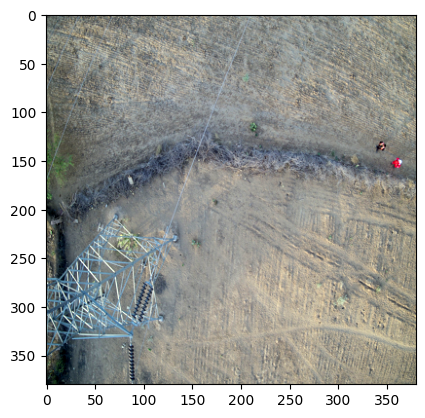

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0993.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_con=ImageEnhance.Contrast(img_resize)
new_con=1.6
img_contrast=curr_con.enhance(new_con)
plt.imshow(img_contrast)
img = img_to_array(img_contrast)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


before image proceesing good image predict bad, after image proceesing good image predict bad. so this image proceesing method can not predict correctly.

 we apply resizing+color to the image.


1/1 [==============================] - 0s 35ms/step
[[0.]]


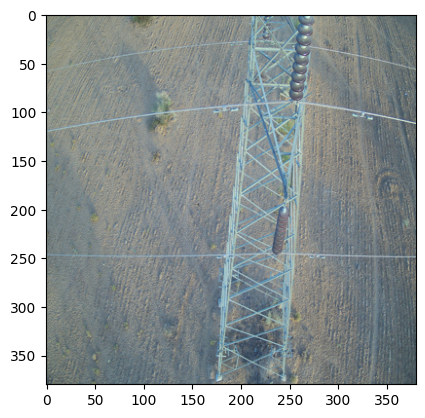

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0869.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 34ms/step
[[0.]]


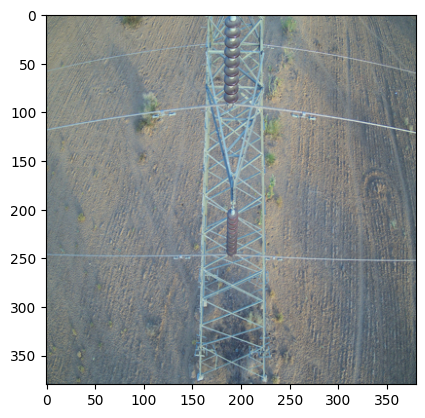

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0871.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 50ms/step
[[0.]]


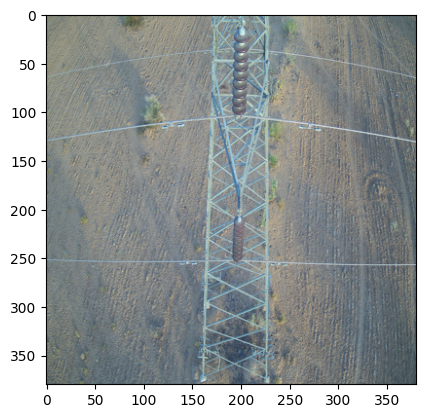

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0873.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 37ms/step
[[0.]]


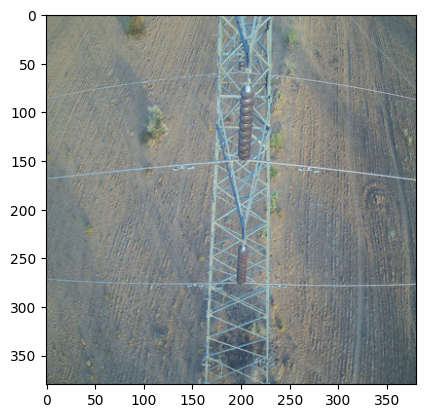

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0875.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 47ms/step
[[0.]]


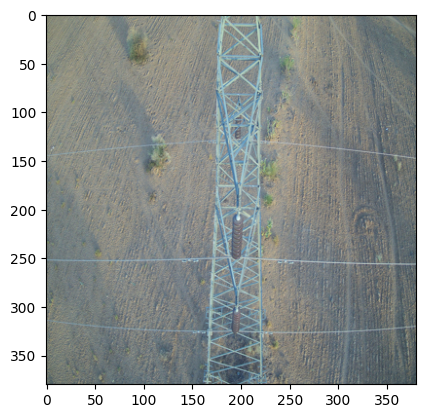

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0877.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 50ms/step
[[0.]]


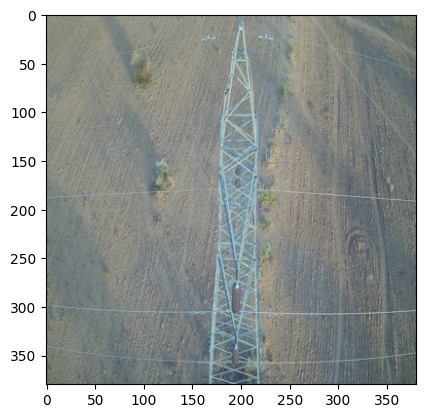

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0879.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 45ms/step
[[0.]]


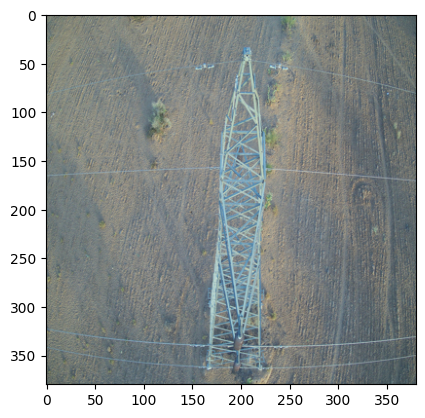

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0881.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 34ms/step
[[0.]]


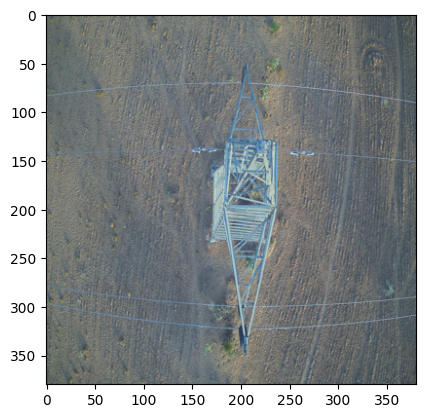

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0883.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)

new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 57ms/step
[[0.]]


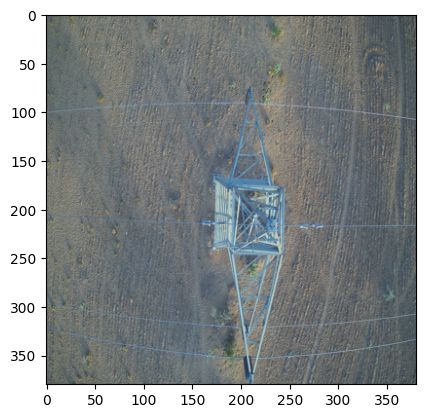

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0885.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 33ms/step
[[0.]]


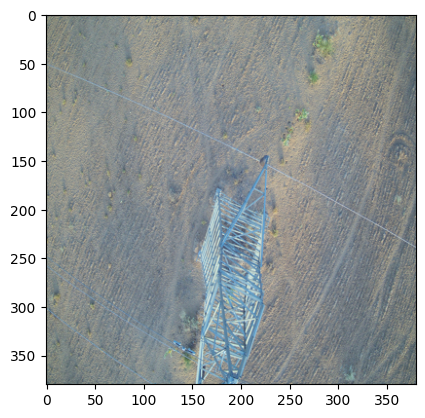

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0887.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 34ms/step
[[0.]]


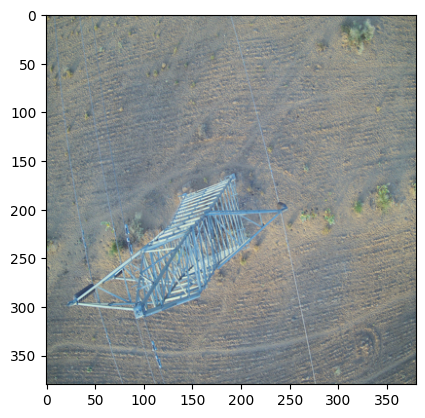

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0889.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 48ms/step
[[0.]]


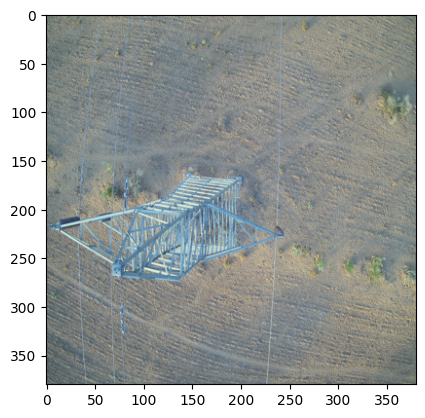

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0891.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 34ms/step
[[0.]]


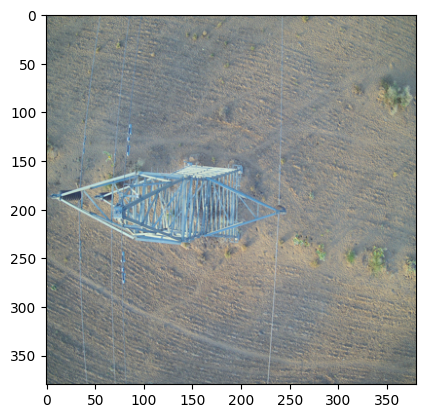

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0893.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 36ms/step
[[0.]]


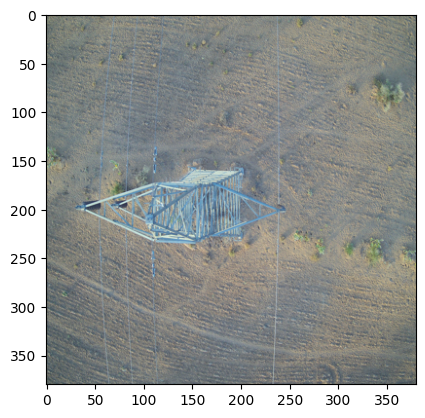

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0895.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 34ms/step
[[0.]]


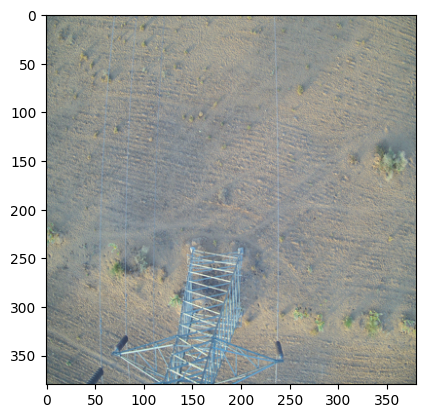

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0901.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 40ms/step
[[0.]]


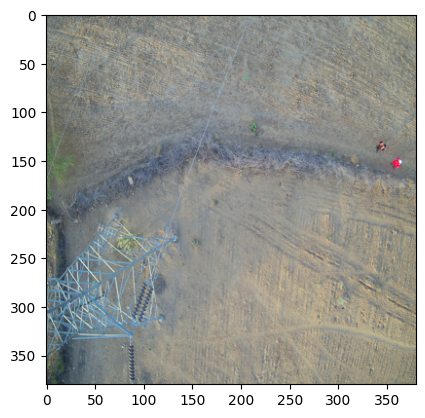

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0993.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 35ms/step
[[0.]]


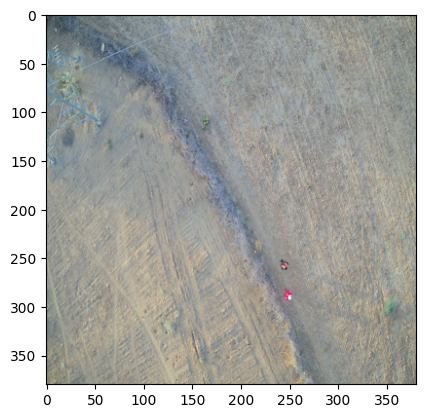

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0995.jpg')
img_resize=image.resize((380,380))
#plt.imshow(img_resize,cmap='gray')
curr_col=ImageEnhance.Color(img_resize)
new_col=1.6
img_color=curr_col.enhance(new_col)
plt.imshow(img_color)
img = img_to_array(img_color)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


before image proceesing good image predict bad, after image proceesing good image predict bad. so this image proceesing method can not predict correctly.

we apply resize+bicubic operation

In [ ]:
from PIL import ImageEnhance
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0995.jpg')
newsize=(380,380)
#plt.imshow(img_resize,cmap='gray')
resized_image=image.resize(newsize,Image.BICUBIC)
img = img_to_array(resized_image)
img = img.reshape(1,380,380,3)
#print(img.shape)
#display(img_brightened)
pred=my_model.predict(img)
print(pred)


1/1 [==============================] - 0s 61ms/step
[[0.]]


before image proceesing good image predict bad, after image proceesing good image predict bad. so this image proceesing method can not predict correctly.

we apply resize+sharpenfilter

In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0995.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0871.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 35ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0935.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 37ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0931.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0921.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0981.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0973.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0971.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 36ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0907.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 36ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0905.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 34ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0903.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 53ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0901.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 33ms/step
[[0.]]


In [ ]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0891.jpg')
img_resize=image.resize((380,380))
image_sharpen=img_resize.filter(ImageFilter.SHARPEN)

img = img_to_array(image_sharpen)
img = img.reshape(1,380,380,3)

pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 36ms/step
[[0.]]


before image proceesing good image predict bad, after image proceesing good image predict bad. so this image proceesing method can not predict correctly.

we apply resize+affine transform

1/1 [==============================] - 0s 89ms/step
[[0.]]


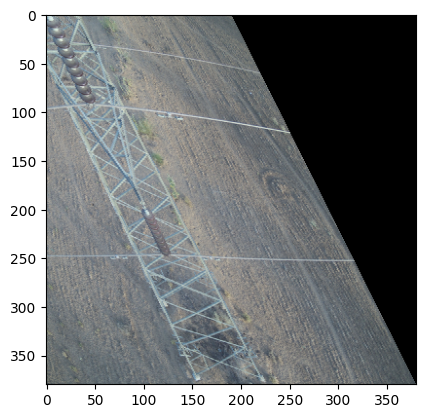

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0871.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 112ms/step
[[0.]]


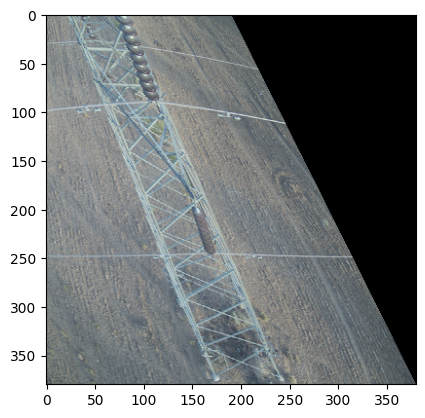

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0869.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 80ms/step
[[0.]]


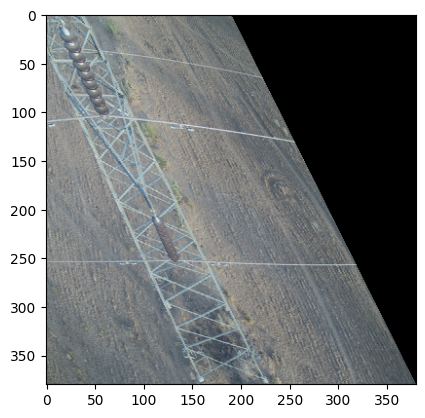

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0873.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 56ms/step
[[0.]]


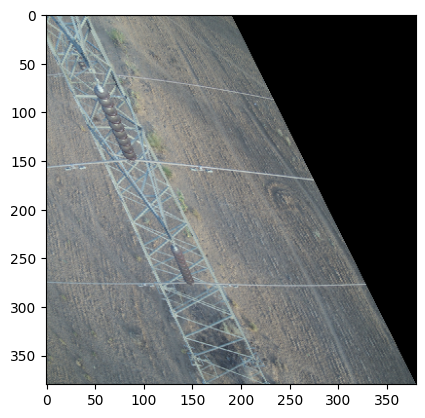

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0875.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 93ms/step
[[0.]]


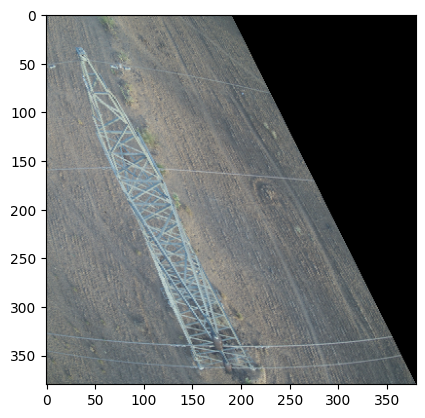

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0881.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 60ms/step
[[0.]]


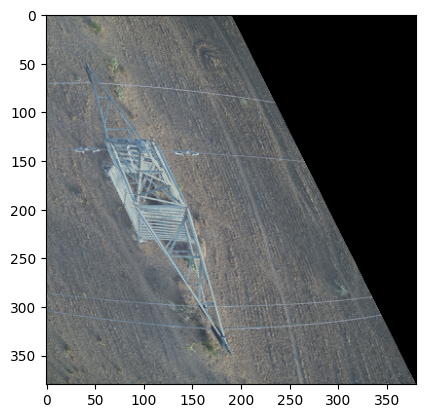

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0883.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 58ms/step
[[0.]]


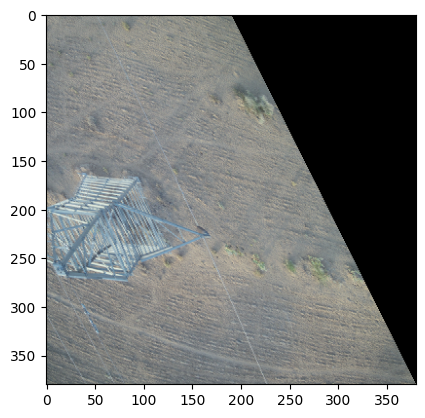

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0891.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 106ms/step
[[0.]]


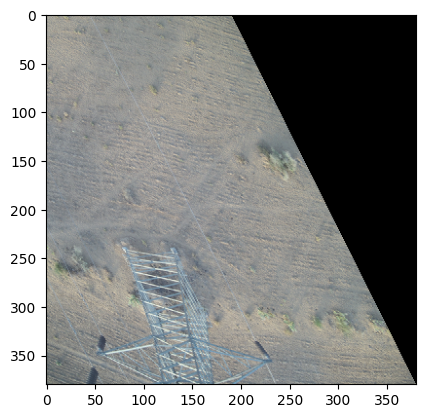

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0901.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 57ms/step
[[0.]]


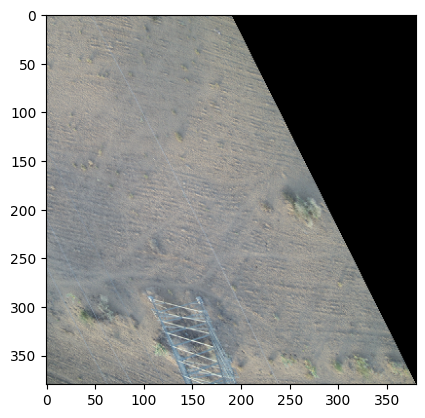

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0903.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 132ms/step
[[0.]]


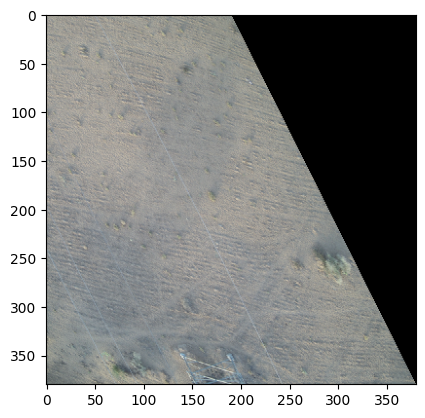

In [ ]:
from PIL import Image
#from PIL import ImageFilter
from PIL.Image import AFFINE
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0905.jpg')
img_resize=image.resize((380,380))
image_transform=img_resize.copy()
image_transform=image_transform.transform(image_transform.size,Image.AFFINE,(1,-0.5,0.5*image_transform.size[0],0,1,0))
plt.imshow(image_transform)
img = img_to_array(image_transform)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



1/1 [==============================] - 0s 66ms/step
[[0.]]


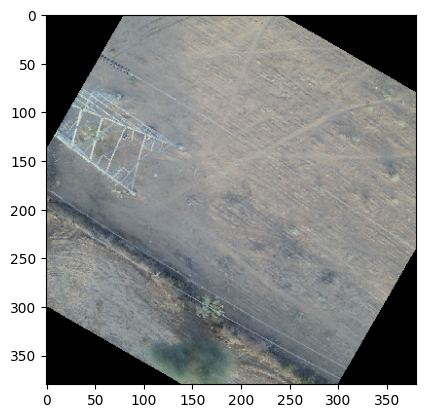

In [ ]:
from PIL import Image
#from PIL import ImageFilter
#from PIL.ImageFilter import SHARPEN
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
angle=60
image=Image.open('/content/gdrive/MyDrive/T51+T52BAD+T53BAD+T54BAD+T57BAD +T58BAD/Test/good_dataset/DJI_0983.jpg')
img_resize=image.resize((380,380))
image=img_resize.rotate(angle)
plt.imshow(image)
img = img_to_array(image)
img = img.reshape(1,380,380,3)
pred=my_model.predict(img)
print(pred)



before image proceesing good image predict bad, after image proceesing good image predict bad. so this image proceesing method can not predict correctly.

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
truth=['bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good','good']
prediction=['bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad','bad']
print(classification_report(truth,prediction))
print(confusion_matrix(truth,prediction))

              precision    recall  f1-score   support

         bad       0.26      1.00      0.41        22
        good       0.00      0.00      0.00        64

    accuracy                           0.26        86
   macro avg       0.13      0.50      0.20        86
weighted avg       0.07      0.26      0.10        86

[[22  0]
 [64  0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


before image processing method  f1-score= 0.26

> Image processing method     F1-score

1.   resizing+brightness          0.26

2.   resizing+contrast            0.26

3.   resizing+color               0.26
4.resizing+bilinear               0.26
5.resizing+medianfilter           0.26
6.resizing+bicubic                0.26
7.resizing+sharpenfilter          0.26
8.resizing+affine                 0.26

